In [1]:
import sys
import torch

print(sys.version)
print(torch.__version__)

3.7.11 (default, Jul 27 2021, 14:32:16) 
[GCC 7.5.0]
1.9.1+cu102


In [8]:
!nvidia-smi -L

GPU 0: NVIDIA GeForce GTX 1080 (UUID: GPU-1100e114-8628-f6c3-a8ce-6d0e0f6c6c59)
GPU 1: NVIDIA GeForce GTX 1080 (UUID: GPU-4039230f-aa06-1210-7c5d-15239c177b94)
GPU 2: NVIDIA GeForce GTX 1080 (UUID: GPU-b5dd049c-6f9e-b4a8-deed-b4cdc158a091)


In [11]:
!cd ~
!pwd -P

import json
token = {"username":"shawnleo","key":"d5ac4356d6ad37234306c8dceb8fa03f"}
with open('./content/kaggle.json', 'w') as file:
    json.dump(token, file)
    
!pip install kaggle
!mkdir -p ~/.kaggle
!cp ./content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle config set -n path -v ./content
!kaggle datasets download -d hgunraj/covidxct
!unzip ./content/datasets/hgunraj/covidxct/covidxct

/home/user/Documents/lxy
     |████████████████████████████████| 58 kB 291 kB/s eta 0:00:01
     |████████████████████████████████| 78 kB 198 kB/s eta 0:00:01
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73052 sha256=6354e8d1a53fc3305a2ad5c6badd1c4002650acb8ad9999e68a444f6ced80c27
  Stored in directory: /tmp/pip-ephem-wheel-cache-x733232o/wheels/62/d6/58/5853130f941e75b2177d281eb7e44b4a98ed46dd155f556dc5
Successfully built kaggle
- path is now set to: ./content
100%|█████████████████████████████████████▉| 28.7G/28.7G [48:10<00:00, 10.5MB/s]
100%|██████████████████████████████████████| 28.7G/28.7G [48:10<00:00, 10.7MB/s]
Archive:  ./content/datasets/hgunraj/covidxct/covidxct.zip
  inflating: 2A_images/137covid_patient100_SR_2_IM00028.png  
  inflating: 2A_images/137covid_patient100_SR_2_IM00029.png  
  inflating: 2A_images/137covid_patient100_SR_2_IM00045.png  
  inflating: 2A_images/137covid_patient100_SR_3_IM00026.png  
  inflating: 2A_images/137covid_patie

In [40]:
import os
import time
import copy
import numpy as np
import pandas as pd
from PIL import Image
import torch,torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets,models,transforms
import torch.optim as optim
# from torchsummary import summary
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from torch.nn import Parameter

In [41]:
# !pip install torchsummary
path='./densenet201/densenet201_3.pth'

In [42]:
from collections.abc import Iterable

def set_freeze_by_idxs(model, idxs, freeze=True): #默认freeze=True是冻结层
    if not isinstance(idxs, Iterable):
        idxs = [idxs]
    num_child = len(list(model.children()))
    idxs = tuple(map(lambda idx: num_child + idx if idx < 0 else idx, idxs))
    for idx, child in enumerate(model.children()):
        if idx not in idxs:
            continue
        for param in child.parameters():
            param.requires_grad = not freeze
    return model
            
def freeze_by_idxs(model, idxs):
    return set_freeze_by_idxs(model, idxs, True)

def unfreeze_by_idxs(model, idxs):
    return set_freeze_by_idxs(model, idxs, False)
def set_parameter_requires_grad(model):#冻结特征提取层
    for param in model.parameters():
        param.requires_grad=False
    return model

def initialize_model(model_name,num_classes,use_pretrained,unfreeze_num):
    if model_name=='vgg16':
        model_pre=models.vgg16(pretrained=use_pretrained) # True：torchversion 已经预训练好的模型，False：随机初始化的模型
#         for i in model_pre.named_children():
#             print(i)
        model_pre.features[0].in_channels=1
        model_pre.features[0].weight=Parameter(model_pre.features[0].weight[:,1:2,:,:])
        model_pre=set_parameter_requires_grad(model_pre) # 冻结全部层
        num_ftrs=model_pre.classifier[6].in_features # feature_map 的大小
        model_pre.classifier[6]=nn.Linear(num_ftrs,num_classes) #重新设计全连接层
        if unfreeze_num==1:
            unfreeze=[-1]
        elif unfreeze_num==2:
            unfreeze=[-1,-3]
        elif unfreeze_num==3:
            unfreeze=[-1,-3,-5]
        else:
            unfreeze=[-1,-3,-5,-7]
        model_pre.features=unfreeze_by_idxs(model_pre.features,unfreeze)
        for param in model_pre.classifier.parameters():
            param.requires_grad=True
        input_size=224
    elif model_name=='vgg19':
        model_pre=models.vgg19(pretrained=use_pretrained) # True：torchversion 已经预训练好的模型，False：随机初始化的模型
        model_pre.features[0].in_channels=1
        model_pre.features[0].weight=Parameter(model_pre.features[0].weight[:,1:2,:,:])
        model_pre=set_parameter_requires_grad(model_pre) # 冻结全部层
        num_ftrs=model_pre.classifier[6].in_features # feature_map 的大小
        model_pre.classifier[6]=nn.Linear(num_ftrs,num_classes) #重新设计全连接层
        if unfreeze_num==1:
            unfreeze=[-1]
        elif unfreeze_num==2:
            unfreeze=[-1,-3]
        elif unfreeze_num==3:
            unfreeze=[-1,-3,-5]
        else:
            unfreeze=[-1,-3,-5,-7]
        model_pre.features=unfreeze_by_idxs(model_pre.features,unfreeze)
        for param in model_pre.classifier.parameters():
            param.requires_grad=True
        input_size=224
    elif model_name=='resnet101':
        model_pre=models.resnet101(pretrained=use_pretrained) # True：torchversion 已经预训练好的模型，False：随机初始化的模型
        model_pre.conv1.in_channels=1
        model_pre.conv1.weight=Parameter(model_pre.conv1.weight[:,1:2,:,:])
        model_pre=set_parameter_requires_grad(model_pre)
        num_ftrs=model_pre.fc.in_features # feature_map 的大小
        model_pre.fc=nn.Linear(num_ftrs,num_classes)
        
        for i in range(unfreeze_num):
            model_pre.layer4=unfreeze_by_idxs(model_pre.layer4,-i)
        for param in model_pre.fc.parameters():
            param.requires_grad=True
        input_size=224
    elif model_name=='resnet152':
        model_pre=models.resnet152(pretrained=use_pretrained) #True：torchversion 已经预训练好的模型，False：随机初始化的模型
        model_pre.conv1.in_channels=1
        model_pre.conv1.weight=Parameter(model_pre.conv1.weight[:,1:2,:,:])
        model_pre=set_parameter_requires_grad(model_pre)
        num_ftrs=model_pre.fc.in_features #feature_map 的大小
        model_pre.fc=nn.Linear(num_ftrs,num_classes)

        for i in range(unfreeze_num):
            model_pre.layer4=unfreeze_by_idxs(model_pre.layer4,-i)
        for param in model_pre.fc.parameters():
            param.requires_grad=True
        input_size=224
    elif model_name=='densenet161':
        model_pre=models.densenet161(pretrained=use_pretrained) #True：torchversion 已经预训练好的模型，False：随机初始化的模型
        model_pre.features[0].in_channels=1
        model_pre.features[0].weight=Parameter(model_pre.features[0].weight[:,1:2,:,:])
        model_pre=set_parameter_requires_grad(model_pre)
        num_ftrs=model_pre.classifier.in_features #feature_map 的大小
        model_pre.classifier=nn.Linear(num_ftrs,num_classes)
        
        for i in range(unfreeze_num):
            model_pre.features.denseblock4=unfreeze_by_idxs(model_pre.features.denseblock4,-i)
        for param in model_pre.classifier.parameters():
            param.requires_grad=True
        input_size=224
    elif model_name=='densenet201':
        model_pre=models.densenet201(pretrained=use_pretrained) #True：torchversion 已经预训练好的模型，False：随机初始化的模型
        model_pre.features[0].in_channels=1
        model_pre.features[0].weight=Parameter(model_pre.features[0].weight[:,1:2,:,:])
        model_pre=set_parameter_requires_grad(model_pre)
        num_ftrs=model_pre.classifier.in_features #feature_map 的大小
        model_pre.classifier=nn.Linear(num_ftrs,num_classes)
        
        for i in range(unfreeze_num):
            model_pre.features.denseblock4=unfreeze_by_idxs(model_pre.features.denseblock4,-i)
        for param in model_pre.classifier.parameters():
            param.requires_grad=True
        input_size=224
    else:
        print('model not implemented')
        return None,None
    return model_pre,input_size

In [43]:
from pathlib import Path
model_all=[]
dir='.'
def auto_net(model_name,num_classes,use_pretrained,unfreeze_num):
    
    for k in range(unfreeze_num):
        model,input_size=initialize_model(model_name,num_classes,use_pretrained,k+1)
        my_path=Path(dir+'/{}'.format(model_name))
        if not my_path.is_dir():    # 若指定的目录不存在，创建文件夹
            os.mkdir(my_path)
        torch.save(model,dir+'/{}/{}_{}.pth'.format(model_name,model_name,k)) # 0 1 2 3
            
        model_all.append(model)
#         print('------------------------删除{}层,添加{}层,倒数{}层求梯度------------------------'.format(i+1,j+1,k+1))
#         for m in model.named_children():
#             print(m)
#         print('----------------')
#         for n in model.named_parameters():
#             print(n)
    return model_all
model_name=['vgg16','vgg19','resnet101','resnet152','densenet161','densenet201'] # 'inception_v3','resnext101'
# for name in model_name:
#     model_all=auto_net(name,num_classes=2,use_pretrained=True,unfreeze_num=4)
model_all=auto_net(model_name[5],num_classes=3,use_pretrained=True,unfreeze_num=4)

/home/user/anaconda3/envs/python37/lib/python3.7/site-packages/torchvision/models/densenet.py:212: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  nn.init.kaiming_normal(m.weight.data)


In [44]:
# 读取train.txt
train_df = pd.read_csv('./train_COVIDx_CT-2A.txt', sep=" ", header=None)
train_df.columns=['filename', 'label', 'xmin','ymin','xmax','ymax']
train_df=train_df.drop(['xmin', 'ymin','xmax', 'ymax'], axis=1 )
# 读取test.txt
val_df = pd.read_csv('./val_COVIDx_CT-2A.txt', sep=" ", header=None)
val_df.columns=['filename', 'label', 'xmin','ymin','xmax','ymax']
val_df=val_df.drop(['xmin', 'ymin','xmax', 'ymax'], axis=1 )

test_df = pd.read_csv('./test_COVIDx_CT-2A.txt', sep=" ", header=None)
test_df.columns=['filename', 'label', 'xmin','ymin','xmax','ymax']
test_df=test_df.drop(['xmin', 'ymin','xmax', 'ymax'], axis=1 )

In [45]:
# labels={0:'Normal',1:'Pneumonia',2:'COVID-19'}
train_df.head()
train_df.label.value_counts()

2    82286
0    35996
1    25496
Name: label, dtype: int64

In [46]:
image_path = './2A_images/'  #directory path
train_df['filename'] = image_path+train_df['filename']
val_df['filename'] = image_path+val_df['filename']
test_df['filename'] = image_path + test_df['filename']
train_df.head()

,filename,label
0,./2A_images/NCP_96_1328_0032.png,2
1,./2A_images/NCP_96_1328_0035.png,2
2,./2A_images/NCP_96_1328_0036.png,2
3,./2A_images/NCP_96_1328_0037.png,2
4,./2A_images/NCP_96_1328_0038.png,2


In [47]:
N  = train_df[train_df['label']==0]
P = train_df[train_df['label']==1]
C = train_df[train_df['label']==2]
from sklearn.utils import resample
N_download = resample(N, replace = True, n_samples = 25496,random_state=0)
C_download = resample(C, replace = True, n_samples = 25496,random_state=0)
train_df = pd.concat([N_download, P, C_download])
train_df.label.value_counts()

0    25496
1    25496
2    25496
Name: label, dtype: int64

In [48]:
N_v  = val_df[val_df['label']==0]
P_v = val_df[val_df['label']==1]
C_v = val_df[val_df['label']==2]
from sklearn.utils import resample
N_v_download = resample(N_v, replace = True, n_samples = 6244,random_state=0)
P_v_download = resample(P_v, replace = True, n_samples = 6244,random_state=0)
val_df = pd.concat([N_v_download, P_v_download, C_v])
val_df.label.value_counts()

0    6244
1    6244
2    6244
Name: label, dtype: int64

In [49]:
train_df = shuffle(train_df) # 打乱顺序
val_df = shuffle(val_df)
test_df = shuffle(test_df)
train_df.head()

,filename,label
54764,./2A_images/Normal_1670_792_0036.png,0
65017,./2A_images/volume-covid19-A-0400_ct-0025.png,2
58133,./2A_images/Normal_750_185_0223.png,0
14245,./2A_images/CP_1559_4237_0030.png,1
68752,./2A_images/137covid_patient10_SR_3_IM00026.png,2


In [50]:
labels={0:'Normal',1:'Pneumonia',2:'COVID-19'}
class_names=['Normal','Pneumonia','COVID-19']

train_df['label_n']=[labels[b] for b in train_df['label']]
val_df['label_n']=[labels[b] for b in val_df['label']]
test_df['label_n']=[labels[b] for b in test_df['label']]
train_df.head()

,filename,label,label_n
54764,./2A_images/Normal_1670_792_0036.png,0,Normal
65017,./2A_images/volume-covid19-A-0400_ct-0025.png,2,COVID-19
58133,./2A_images/Normal_750_185_0223.png,0,Normal
14245,./2A_images/CP_1559_4237_0030.png,1,Pneumonia
68752,./2A_images/137covid_patient10_SR_3_IM00026.png,2,COVID-19


In [51]:
print(f"Negative and positive values of train: \n{train_df['label_n'].value_counts()}")
print(f"Negative and positive values of validation: \n{val_df['label_n'].value_counts()}")
print(f"Negative and positive values of test: \n{test_df['label_n'].value_counts()}")

Negative and positive values of train: 
Normal       25496
COVID-19     25496
Pneumonia    25496
Name: label_n, dtype: int64
Negative and positive values of validation: 
Normal       6244
COVID-19     6244
Pneumonia    6244
Name: label_n, dtype: int64
Negative and positive values of test: 
Normal       12245
Pneumonia     7395
COVID-19      6018
Name: label_n, dtype: int64


In [52]:
train_df=train_df.reset_index()
val_df=val_df.reset_index()
test_df=test_df.reset_index()

In [53]:
class CovidDataset(Dataset):
    def __init__(self, dataset_df, transform=None):
        self.dataset_df = dataset_df
        self.transform = transform
        
    def __len__(self):
        return self.dataset_df.shape[0]
    
    def __getitem__(self, idx):
        image_name = self.dataset_df['filename'][idx]
        img = Image.open(image_name)
        label = self.dataset_df['label'][idx]
        
        if self.transform:
            img = self.transform(img)
        return img, label

In [54]:
batch_size = 64
input_channel = 1
input_size = (224,224)
crop_size=(340,380)
num_classes=3
num_epochs = 25

In [55]:
transform = {
    'train':transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(30),
        transforms.CenterCrop(crop_size),
        transforms.Resize(input_size),
        transforms.Grayscale(input_channel),
        transforms.ToTensor(),
        transforms.Normalize([0.6349431],[0.32605055])
    ]),
    'test':transforms.Compose([
        transforms.CenterCrop(crop_size),
        transforms.Resize(input_size),
        transforms.Grayscale(input_channel),
        transforms.ToTensor(),
        transforms.Normalize([0.63507175],[0.3278614])
    ])
}

In [56]:
dataset_names=['train','val','test']
image_transforms = {'train':transform['train'], 'val':transform['test'],'test':transform['test']}

train_dataset = CovidDataset(train_df, transform=image_transforms['train'])
val_dataset = CovidDataset(val_df, transform=image_transforms['val'])
test_dataset = CovidDataset(test_df, transform=image_transforms['test'])

image_dataset = {'train':train_dataset, 'val':val_dataset,'test':test_dataset}

dataloaders = {x:DataLoader(image_dataset[x],batch_size=batch_size,shuffle=True,num_workers=4) for x in dataset_names}

dataset_sizes = {x:len(image_dataset[x]) for x in dataset_names}

# class_names = {}
# print(dataset_sizes)
# print(class_names)

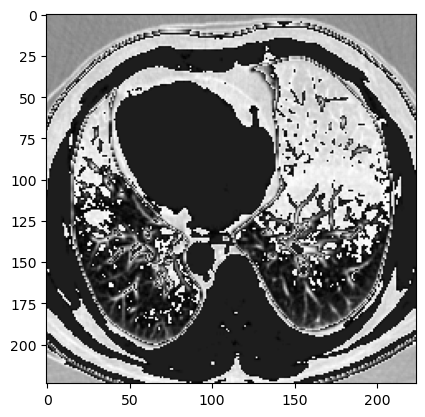

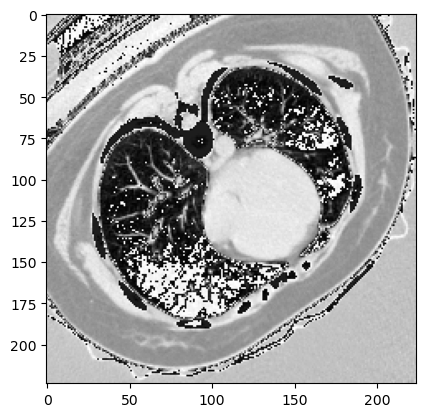

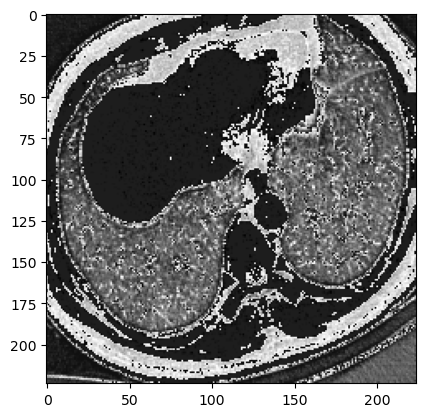

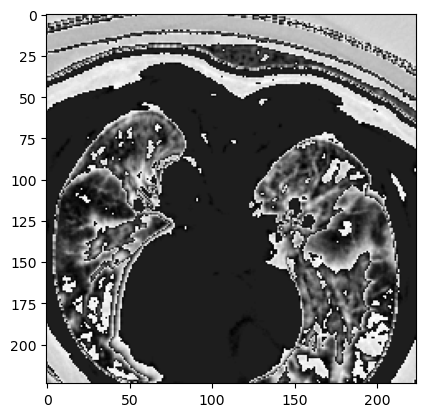

In [57]:
import matplotlib.pyplot as plt
from PIL import Image
def show_tensor_img(tensor_img):
#     to_pil = transforms.ToPILImage()
#     img = tensor_img.cpu().clone()
#     img = to_pil(img)
    img=transforms.ToPILImage()(tensor_img)
    plt.figure()
    plt.imshow(img,plt.cm.gray)
    plt.show()

def show_img(idx):
    show_tensor_img(train_dataset[idx][0])
for i in range(4):
    show_img(i)

In [58]:
import itertools
# 绘制混淆矩阵
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    Input
    - cm : 计算出的混淆矩阵的值
    - classes : 混淆矩阵中每一行每一列对应的列
    - normalize : True:显示百分比, False:显示个数
    """
    cm=cm.numpy()
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        cm=cm.astype('int')
        print('Confusion matrix, without normalization')
#     print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    fmt = '{:.2f}' if normalize else '{}'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(i, j, fmt.format(cm[i, j]),horizontalalignment="center",color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('./confusion_matrix/' + title + '.png')
    plt.show()

# 生成混淆矩阵
def confusion_matrix(preds, labels, conf_matrix):
    preds = torch.argmax(preds, 1)
    for p, t in zip(preds, labels):
        conf_matrix[t, p] += 1
    return conf_matrix

def calculate_all_prediction(conf_matrix):
    '''
    计算总精度：对角线上所有值除以总数
    '''
    total_sum = conf_matrix.sum()
    correct_sum = (np.diag(conf_matrix)).sum()
    prediction = round(100*float(correct_sum)/float(total_sum),2)
    return prediction
 
def calculate_label_prediction(conf_matrix,labelidx):
    '''
    计算某一个类标预测精度：该类被预测正确的数除以该类的总数
    '''
    label_total_sum = conf_matrix.sum(axis=0)[labelidx]
    label_correct_sum = conf_matrix[labelidx][labelidx]
    prediction = 0
    if label_total_sum != 0:
        prediction = round(100*float(label_correct_sum)/float(label_total_sum),2)
    return prediction
 
def calculate_label_recall(conf_matrix,labelidx):
    '''
    计算某一个类标的召回率：
    '''
    label_total_sum = conf_matrix.sum(axis=1)[labelidx]
    label_correct_sum = conf_matrix[labelidx][labelidx]
    recall = 0
    if label_total_sum != 0:
        recall = round(100*float(label_correct_sum)/float(label_total_sum),2)
    return recall
 
def calculate_f1(prediction,recall):
    if (prediction+recall)==0:
        return 0
    return round(2*prediction*recall/(prediction+recall),2)

In [59]:
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# path='./vgg16/vgg16_1.pth'
model=torch.load(path)
model=model.to(device)
# print(model)

# model=models.vgg16(pretrained=True)
# # 将所有参数都设置为不计算梯度
# for param in model.parameters():
#     param.requires_grad=False
# num_ftrs=model.classifier[6].in_features # feature_map 的大小
# model.classifier[6]=nn.Linear(num_ftrs,num_classes) #重新设计全连接层
# model=model.to(device)

criterion=nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.0001,betas=(0.9, 0.999)) #优化函数

In [60]:
def train(model,epoch,num_epochs,criterion,optimizer):
    model.train()
    print('-' * 100)
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    running_loss = 0.0
    running_corrects = 0
    for idx, (inputs, labels) in enumerate(dataloaders['train']):# 对dataloader进行遍历，dataloader时包含数据及标签的元组
        inputs,labels=inputs.to(device),labels.to(device)
        outputs = model(inputs) # output接受结果
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)  # 默认平均，计算损失值

        #反向传播及更新
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if idx % 100 == 99:
            print('train iteration:{},loss:{},acc:{}%'.format( idx, loss.item(),torch.sum(preds == labels.data)/batch_size*100))
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / dataset_sizes['train']
    epoch_acc = running_corrects.double() / dataset_sizes['train']
    print('train_total Loss: {:.4f} Acc: {:.4f}%'.format( epoch_loss, epoch_acc*100))
    return epoch_loss

In [61]:
def test(model,epoch,num_epochs,criterion,optimizer,best_acc):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    best_acc=best_acc
    best_model_wts=copy.deepcopy(model.state_dict())
    conf_matrix = torch.zeros(num_classes, num_classes) # 混淆矩阵初始化
    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(dataloaders['val']):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            conf_matrix = confusion_matrix(outputs, labels, conf_matrix) # 生成混淆矩阵

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data) #preds是tensor,labels.data是tensor

        plot_confusion_matrix(conf_matrix, classes=class_names, normalize=False, title='confusion matrix epoch ' + str(epoch)) # 混淆矩阵的可视化

    epoch_loss = running_loss / dataset_sizes['val'] 
    epoch_acc = running_corrects.double() / dataset_sizes['val'] #type为tensor
    print('val_total Loss: {:.4f} Acc: {:.4f}%'.format( epoch_loss, epoch_acc*100))

    all_prediction = calculate_all_prediction(conf_matrix) # 总精度=准确率
    print('all_prediction:{}'.format(all_prediction))
    label_prediction = [] # 存放每个类的精确率
    label_recall = [] # 存放每个类的召回率
    for i in range(num_classes):
        label_prediction.append(calculate_label_prediction(conf_matrix,i))
        label_recall.append(calculate_label_recall(conf_matrix,i))

    keys=class_names
    values=list(range(num_classes))
    dictionary = dict(zip(keys, values))
    for ei,i in enumerate(dictionary):
        print(ei,'\t',i,'\t','prediction=',label_prediction[ei],'%,\trecall=',label_recall[ei],'%,\tf1=',calculate_f1(label_prediction[ei],label_recall[ei])) # 输出每个类的，精确率，召回率，F1
    p = round(np.array(label_prediction).sum()/len(label_prediction),2) # 总精确率
    r = round(np.array(label_recall).sum()/len(label_prediction),2) # 总召回率
    print('MACRO-averaged:\nprediction=',p,'%,recall=',r,'%,f1=',calculate_f1(p,r)) #输出总精确率和召回率

#     print(epoch_acc.tpye)
#     print(best_acc.type)
    if epoch_acc > best_acc:# 获取最好的模型和准确率
        best_acc=epoch_acc.item()
        best_model_wts=copy.deepcopy(model.state_dict())
#     model.load_state_dict(best_model_wts)

    return best_model_wts,best_acc,epoch_acc.item()

----------------------------------------------------------------------------------------------------
Epoch 0/24
train iteration:99,loss:0.35964804887771606,acc:96.875%
train iteration:199,loss:0.1716756969690323,acc:96.875%
train iteration:299,loss:0.18507547676563263,acc:93.75%
train iteration:399,loss:0.14831824600696564,acc:95.3125%
train iteration:499,loss:0.16924458742141724,acc:92.1875%
train iteration:599,loss:0.06147947534918785,acc:98.4375%
train iteration:699,loss:0.05996578931808472,acc:100.0%
train iteration:799,loss:0.16964955627918243,acc:92.1875%
train iteration:899,loss:0.04103706032037735,acc:100.0%
train iteration:999,loss:0.026043059304356575,acc:100.0%
train iteration:1099,loss:0.04291733726859093,acc:98.4375%
train iteration:99,loss:0.16927722096443176,acc:95.3125%
train iteration:199,loss:0.053220201283693314,acc:96.875%
train iteration:299,loss:0.04664692282676697,acc:96.875%
train iteration:399,loss:0.07477253675460815,acc:96.875%
train iteration:499,loss:0.1224

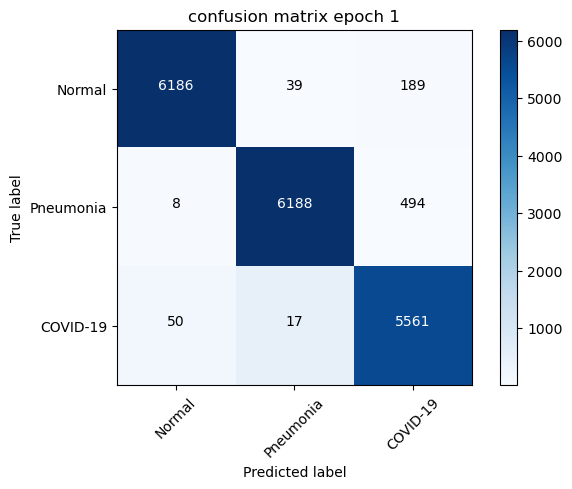

val_total Loss: 0.1406 Acc: 95.7452%
all_prediction:95.75
0 	 Normal 	 prediction= 96.45 %,	recall= 99.07 %,	f1= 97.74
1 	 Pneumonia 	 prediction= 92.5 %,	recall= 99.1 %,	f1= 95.69
2 	 COVID-19 	 prediction= 98.81 %,	recall= 89.06 %,	f1= 93.68
MACRO-averaged:
prediction= 95.92 %,recall= 95.74 %,f1= 95.83
----------------------------------------------------------------------------------------------------
Epoch 2/24
train iteration:99,loss:0.009433974511921406,acc:100.0%
train iteration:199,loss:0.02972622774541378,acc:100.0%
train iteration:299,loss:0.013687961734831333,acc:100.0%
train iteration:399,loss:0.02528362348675728,acc:98.4375%
train iteration:499,loss:0.05678277090191841,acc:98.4375%
train iteration:599,loss:0.008481203578412533,acc:100.0%
train iteration:699,loss:0.12248211354017258,acc:96.875%
train iteration:799,loss:0.006269972771406174,acc:100.0%
train iteration:899,loss:0.015534955076873302,acc:100.0%
train iteration:999,loss:0.0238930806517601,acc:98.4375%
train iterat

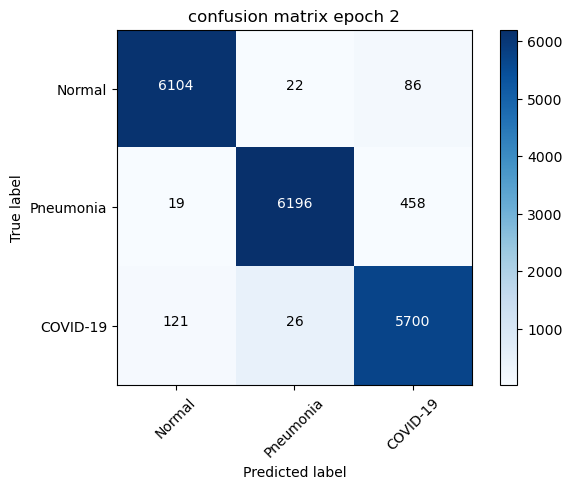

val_total Loss: 0.1353 Acc: 96.0922%
all_prediction:96.09
0 	 Normal 	 prediction= 98.26 %,	recall= 97.76 %,	f1= 98.01
1 	 Pneumonia 	 prediction= 92.85 %,	recall= 99.23 %,	f1= 95.93
2 	 COVID-19 	 prediction= 97.49 %,	recall= 91.29 %,	f1= 94.29
MACRO-averaged:
prediction= 96.2 %,recall= 96.09 %,f1= 96.14
----------------------------------------------------------------------------------------------------
Epoch 3/24
train iteration:99,loss:0.027021579444408417,acc:100.0%
train iteration:199,loss:0.016309425234794617,acc:100.0%
train iteration:299,loss:0.0221675056964159,acc:100.0%
train iteration:399,loss:0.07168357074260712,acc:96.875%
train iteration:499,loss:0.0013168060686439276,acc:100.0%
train iteration:599,loss:0.032633911818265915,acc:98.4375%
train iteration:699,loss:0.005818628240376711,acc:100.0%
train iteration:799,loss:0.04903353378176689,acc:98.4375%
train iteration:899,loss:0.004349713213741779,acc:100.0%
train iteration:999,loss:0.0031108001712709665,acc:100.0%
train ite

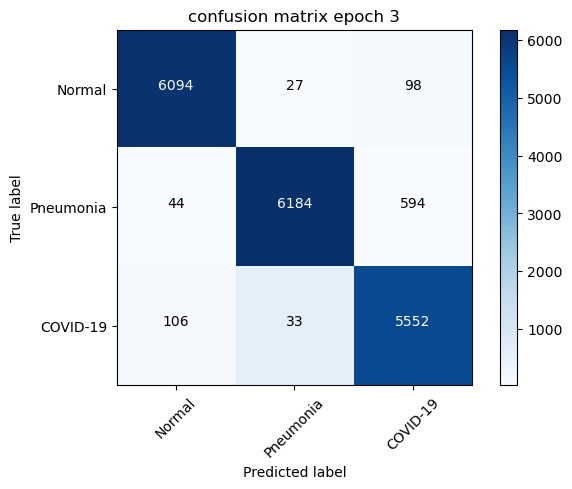

val_total Loss: 0.1977 Acc: 95.1847%
all_prediction:95.18
0 	 Normal 	 prediction= 97.99 %,	recall= 97.6 %,	f1= 97.79
1 	 Pneumonia 	 prediction= 90.65 %,	recall= 99.04 %,	f1= 94.66
2 	 COVID-19 	 prediction= 97.56 %,	recall= 88.92 %,	f1= 93.04
MACRO-averaged:
prediction= 95.4 %,recall= 95.19 %,f1= 95.29
----------------------------------------------------------------------------------------------------
Epoch 4/24
train iteration:99,loss:0.0013456622837111354,acc:100.0%
train iteration:199,loss:0.006157748866826296,acc:100.0%
train iteration:299,loss:0.011908072978258133,acc:100.0%
train iteration:399,loss:0.011072062887251377,acc:100.0%
train iteration:499,loss:0.0022878663148730993,acc:100.0%
train iteration:599,loss:0.008607550524175167,acc:100.0%
train iteration:699,loss:0.007989843375980854,acc:100.0%
train iteration:799,loss:0.00977786909788847,acc:100.0%
train iteration:899,loss:0.0009529013186693192,acc:100.0%
train iteration:999,loss:0.011439730413258076,acc:100.0%
train itera

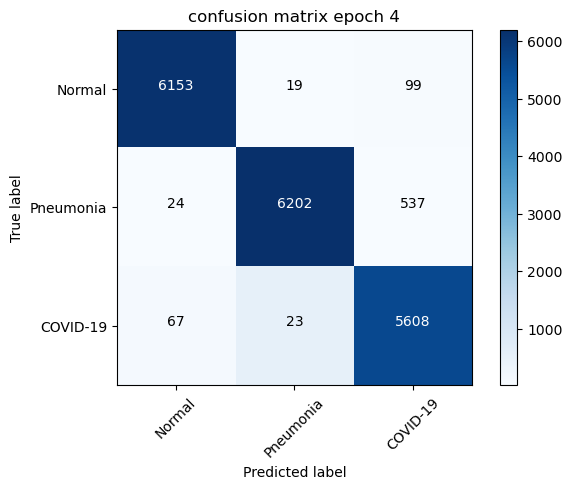

val_total Loss: 0.1684 Acc: 95.8947%
all_prediction:95.89
0 	 Normal 	 prediction= 98.12 %,	recall= 98.54 %,	f1= 98.33
1 	 Pneumonia 	 prediction= 91.7 %,	recall= 99.33 %,	f1= 95.36
2 	 COVID-19 	 prediction= 98.42 %,	recall= 89.81 %,	f1= 93.92
MACRO-averaged:
prediction= 96.08 %,recall= 95.89 %,f1= 95.98
----------------------------------------------------------------------------------------------------
Epoch 5/24
train iteration:99,loss:0.015237771905958652,acc:100.0%
train iteration:199,loss:0.005854062270373106,acc:100.0%
train iteration:299,loss:0.005626359023153782,acc:100.0%
train iteration:399,loss:0.004218408837914467,acc:100.0%
train iteration:499,loss:0.01228199154138565,acc:98.4375%
train iteration:599,loss:0.018701747059822083,acc:100.0%
train iteration:699,loss:0.005072813481092453,acc:100.0%
train iteration:799,loss:0.004209595266729593,acc:100.0%
train iteration:899,loss:0.0021009151823818684,acc:100.0%
train iteration:999,loss:0.0023854044266045094,acc:100.0%
train ite

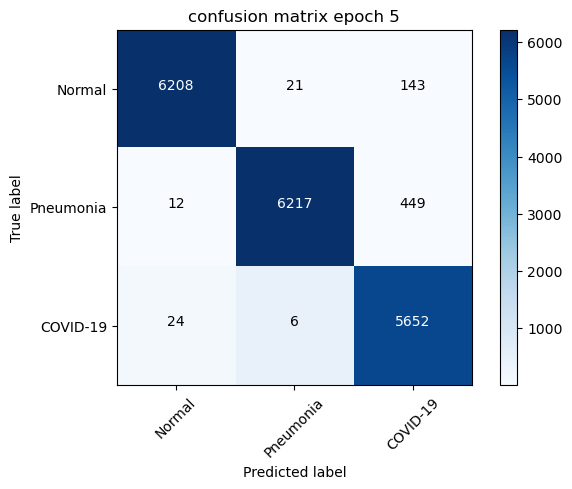

val_total Loss: 0.1479 Acc: 96.5033%
all_prediction:96.5
0 	 Normal 	 prediction= 97.43 %,	recall= 99.42 %,	f1= 98.41
1 	 Pneumonia 	 prediction= 93.1 %,	recall= 99.57 %,	f1= 96.23
2 	 COVID-19 	 prediction= 99.47 %,	recall= 90.52 %,	f1= 94.78
MACRO-averaged:
prediction= 96.67 %,recall= 96.5 %,f1= 96.58
----------------------------------------------------------------------------------------------------
Epoch 6/24
train iteration:99,loss:0.05953502655029297,acc:96.875%
train iteration:199,loss:0.0026739032473415136,acc:100.0%
train iteration:299,loss:0.005738218314945698,acc:100.0%
train iteration:399,loss:0.001997442217543721,acc:100.0%
train iteration:499,loss:0.03233005478978157,acc:98.4375%
train iteration:599,loss:0.026274600997567177,acc:98.4375%
train iteration:699,loss:0.004030720796436071,acc:100.0%
train iteration:799,loss:0.03952234238386154,acc:98.4375%
train iteration:899,loss:0.0169361662119627,acc:100.0%
train iteration:999,loss:0.0030637190211564302,acc:100.0%
train iter

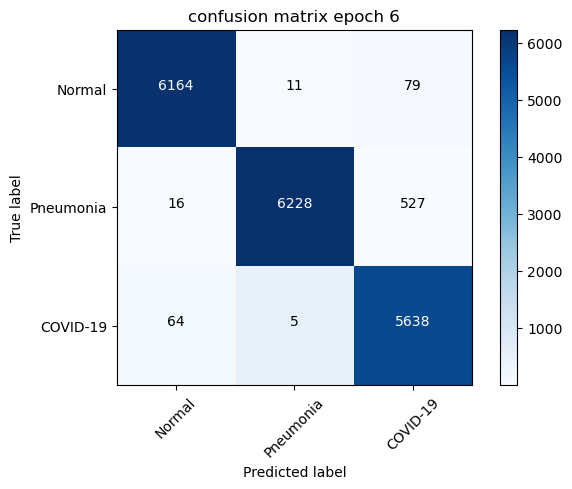

val_total Loss: 0.1666 Acc: 96.2524%
all_prediction:96.25
0 	 Normal 	 prediction= 98.56 %,	recall= 98.72 %,	f1= 98.64
1 	 Pneumonia 	 prediction= 91.98 %,	recall= 99.74 %,	f1= 95.7
2 	 COVID-19 	 prediction= 98.79 %,	recall= 90.29 %,	f1= 94.35
MACRO-averaged:
prediction= 96.44 %,recall= 96.25 %,f1= 96.34
----------------------------------------------------------------------------------------------------
Epoch 7/24
train iteration:99,loss:0.0031532368157058954,acc:100.0%
train iteration:199,loss:0.030913520604372025,acc:98.4375%
train iteration:299,loss:0.002951278118416667,acc:100.0%
train iteration:399,loss:0.0071550169959664345,acc:100.0%
train iteration:499,loss:0.0053055621683597565,acc:100.0%
train iteration:599,loss:0.015630479902029037,acc:98.4375%
train iteration:699,loss:0.0022678072564303875,acc:100.0%
train iteration:799,loss:0.004866254515945911,acc:100.0%
train iteration:899,loss:0.008615929633378983,acc:100.0%
train iteration:999,loss:0.006487217731773853,acc:100.0%
trai

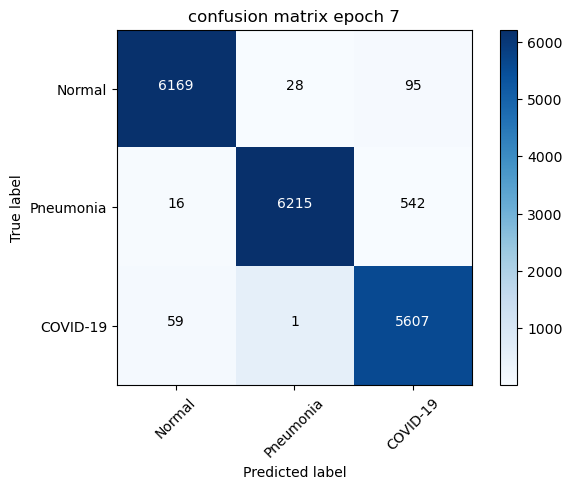

val_total Loss: 0.1602 Acc: 96.0442%
all_prediction:96.04
0 	 Normal 	 prediction= 98.05 %,	recall= 98.8 %,	f1= 98.42
1 	 Pneumonia 	 prediction= 91.76 %,	recall= 99.54 %,	f1= 95.49
2 	 COVID-19 	 prediction= 98.94 %,	recall= 89.8 %,	f1= 94.15
MACRO-averaged:
prediction= 96.25 %,recall= 96.05 %,f1= 96.15
----------------------------------------------------------------------------------------------------
Epoch 8/24
train iteration:99,loss:0.05985436961054802,acc:98.4375%
train iteration:199,loss:0.0038130793254822493,acc:100.0%
train iteration:299,loss:0.006746934726834297,acc:100.0%
train iteration:399,loss:0.0245773047208786,acc:98.4375%
train iteration:499,loss:0.002389796543866396,acc:100.0%
train iteration:599,loss:0.00376782170496881,acc:100.0%
train iteration:699,loss:0.0012084951158612967,acc:100.0%
train iteration:799,loss:0.005213859956711531,acc:100.0%
train iteration:899,loss:0.002051703631877899,acc:100.0%
train iteration:999,loss:0.010493789799511433,acc:100.0%
train itera

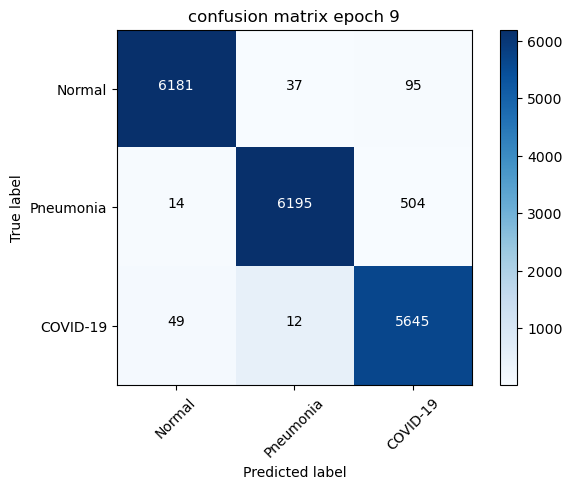

val_total Loss: 0.1623 Acc: 96.2044%
all_prediction:96.2
0 	 Normal 	 prediction= 97.91 %,	recall= 98.99 %,	f1= 98.45
1 	 Pneumonia 	 prediction= 92.28 %,	recall= 99.22 %,	f1= 95.62
2 	 COVID-19 	 prediction= 98.93 %,	recall= 90.41 %,	f1= 94.48
MACRO-averaged:
prediction= 96.37 %,recall= 96.21 %,f1= 96.29
----------------------------------------------------------------------------------------------------
Epoch 10/24
train iteration:99,loss:0.0009835673263296485,acc:100.0%
train iteration:199,loss:0.0007103763637132943,acc:100.0%
train iteration:299,loss:0.0003840652061626315,acc:100.0%
train iteration:399,loss:0.0017093472415581346,acc:100.0%
train iteration:499,loss:0.0035244442988187075,acc:100.0%
train iteration:599,loss:0.0059289573691785336,acc:100.0%
train iteration:699,loss:0.02133519947528839,acc:98.4375%
train iteration:799,loss:0.002419715514406562,acc:100.0%
train iteration:899,loss:0.015065668150782585,acc:100.0%
train iteration:999,loss:0.0043199029751122,acc:100.0%
train 

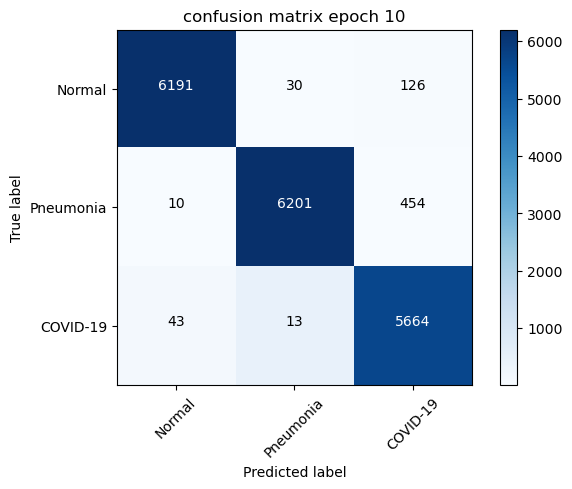

val_total Loss: 0.1506 Acc: 96.3912%
all_prediction:96.39
0 	 Normal 	 prediction= 97.54 %,	recall= 99.15 %,	f1= 98.34
1 	 Pneumonia 	 prediction= 93.04 %,	recall= 99.31 %,	f1= 96.07
2 	 COVID-19 	 prediction= 99.02 %,	recall= 90.71 %,	f1= 94.68
MACRO-averaged:
prediction= 96.53 %,recall= 96.39 %,f1= 96.46
----------------------------------------------------------------------------------------------------
Epoch 11/24
train iteration:99,loss:0.0015646310057491064,acc:100.0%
train iteration:199,loss:0.0010666691232472658,acc:100.0%
train iteration:299,loss:0.012133760377764702,acc:100.0%
train iteration:399,loss:0.0008608298958279192,acc:100.0%
train iteration:499,loss:0.01591368578374386,acc:98.4375%
train iteration:599,loss:0.0010349175427109003,acc:100.0%
train iteration:699,loss:0.0018110800301656127,acc:100.0%
train iteration:799,loss:0.0021463665179908276,acc:100.0%
train iteration:899,loss:0.0029684915207326412,acc:100.0%
train iteration:999,loss:0.04297245666384697,acc:98.4375%
t

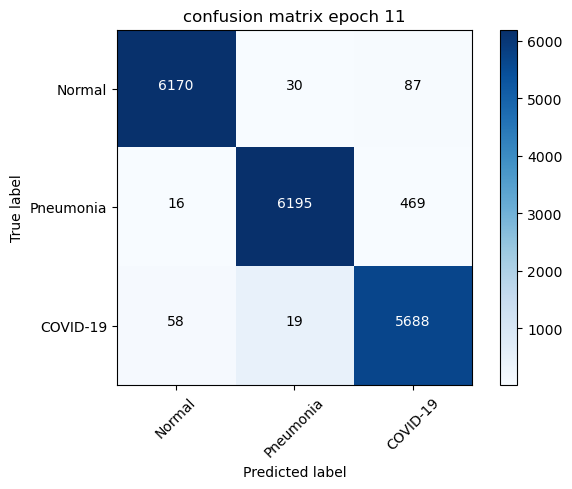

val_total Loss: 0.2162 Acc: 96.3752%
all_prediction:96.38
0 	 Normal 	 prediction= 98.14 %,	recall= 98.81 %,	f1= 98.47
1 	 Pneumonia 	 prediction= 92.74 %,	recall= 99.22 %,	f1= 95.87
2 	 COVID-19 	 prediction= 98.66 %,	recall= 91.1 %,	f1= 94.73
MACRO-averaged:
prediction= 96.51 %,recall= 96.38 %,f1= 96.44
----------------------------------------------------------------------------------------------------
Epoch 12/24
train iteration:99,loss:0.0010690641356632113,acc:100.0%
train iteration:199,loss:0.008548496291041374,acc:100.0%
train iteration:299,loss:0.0013493791921064258,acc:100.0%
train iteration:399,loss:0.0005665771896019578,acc:100.0%
train iteration:499,loss:0.0015932064270600677,acc:100.0%
train iteration:599,loss:0.00805661454796791,acc:100.0%
train iteration:699,loss:0.0028411175590008497,acc:100.0%
train iteration:799,loss:0.00690437899902463,acc:100.0%
train iteration:899,loss:0.005421881098300219,acc:100.0%
train iteration:999,loss:0.0007541195373050869,acc:100.0%
train i

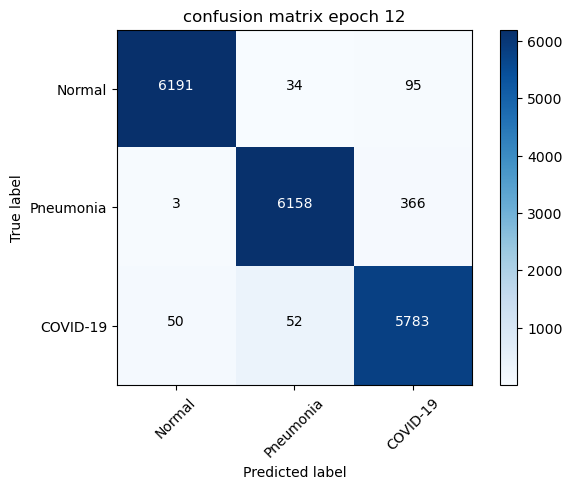

val_total Loss: 0.1198 Acc: 96.7969%
all_prediction:96.8
0 	 Normal 	 prediction= 97.96 %,	recall= 99.15 %,	f1= 98.55
1 	 Pneumonia 	 prediction= 94.35 %,	recall= 98.62 %,	f1= 96.44
2 	 COVID-19 	 prediction= 98.27 %,	recall= 92.62 %,	f1= 95.36
MACRO-averaged:
prediction= 96.86 %,recall= 96.8 %,f1= 96.83
----------------------------------------------------------------------------------------------------
Epoch 13/24
train iteration:99,loss:0.008465413004159927,acc:100.0%
train iteration:199,loss:0.0007210748153738678,acc:100.0%
train iteration:299,loss:0.026271069422364235,acc:98.4375%
train iteration:399,loss:0.00039900784031488,acc:100.0%
train iteration:499,loss:0.009334078058600426,acc:100.0%
train iteration:599,loss:0.0012390012852847576,acc:100.0%
train iteration:699,loss:0.0003767340094782412,acc:100.0%
train iteration:799,loss:0.0070459493435919285,acc:100.0%
train iteration:1099,loss:0.002264684997498989,acc:100.0%
Confusion matrix, without normalization


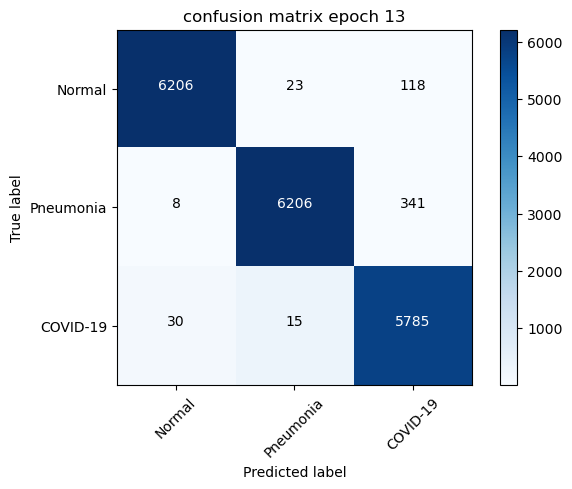

val_total Loss: 0.1128 Acc: 97.1439%
all_prediction:97.14
0 	 Normal 	 prediction= 97.78 %,	recall= 99.39 %,	f1= 98.58
1 	 Pneumonia 	 prediction= 94.68 %,	recall= 99.39 %,	f1= 96.98
2 	 COVID-19 	 prediction= 99.23 %,	recall= 92.65 %,	f1= 95.83
MACRO-averaged:
prediction= 97.23 %,recall= 97.14 %,f1= 97.18
----------------------------------------------------------------------------------------------------
Epoch 14/24
train iteration:99,loss:0.0003121671616099775,acc:100.0%
train iteration:199,loss:0.0013213986530900002,acc:100.0%
train iteration:299,loss:0.00026015855837613344,acc:100.0%
train iteration:399,loss:0.0002475982764735818,acc:100.0%
train iteration:499,loss:0.0004705152241513133,acc:100.0%
train iteration:599,loss:0.0033000539988279343,acc:100.0%
train iteration:699,loss:0.0012676991755142808,acc:100.0%
train iteration:799,loss:0.0006786645972169936,acc:100.0%
train iteration:899,loss:0.004695948679000139,acc:100.0%
train iteration:999,loss:0.0007474722224287689,acc:100.0%


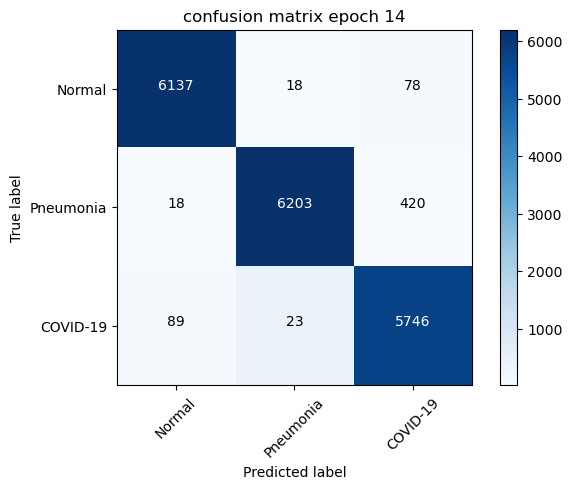

val_total Loss: 0.1449 Acc: 96.5514%
all_prediction:96.55
0 	 Normal 	 prediction= 98.46 %,	recall= 98.29 %,	f1= 98.37
1 	 Pneumonia 	 prediction= 93.4 %,	recall= 99.34 %,	f1= 96.28
2 	 COVID-19 	 prediction= 98.09 %,	recall= 92.02 %,	f1= 94.96
MACRO-averaged:
prediction= 96.65 %,recall= 96.55 %,f1= 96.6
----------------------------------------------------------------------------------------------------
Epoch 15/24
train iteration:99,loss:0.0019375052070245147,acc:100.0%
train iteration:199,loss:0.0006632676813751459,acc:100.0%
train iteration:299,loss:0.03574924170970917,acc:98.4375%
train iteration:399,loss:0.012608655728399754,acc:98.4375%
train iteration:499,loss:0.007414969149976969,acc:100.0%
train iteration:599,loss:0.024190062656998634,acc:98.4375%
train iteration:699,loss:0.003979061730206013,acc:100.0%
train iteration:799,loss:0.014901619404554367,acc:100.0%
train iteration:899,loss:0.0031001411844044924,acc:100.0%
train iteration:999,loss:0.000875984609592706,acc:100.0%
trai

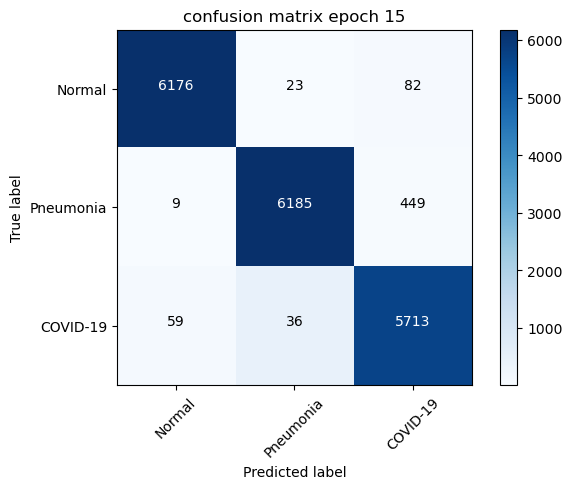

val_total Loss: 0.2000 Acc: 96.4873%
all_prediction:96.49
0 	 Normal 	 prediction= 98.33 %,	recall= 98.91 %,	f1= 98.62
1 	 Pneumonia 	 prediction= 93.11 %,	recall= 99.06 %,	f1= 95.99
2 	 COVID-19 	 prediction= 98.36 %,	recall= 91.5 %,	f1= 94.81
MACRO-averaged:
prediction= 96.6 %,recall= 96.49 %,f1= 96.54
----------------------------------------------------------------------------------------------------
Epoch 16/24
train iteration:99,loss:0.017415419220924377,acc:98.4375%
train iteration:199,loss:0.02053709141910076,acc:98.4375%
train iteration:299,loss:0.0003700124507304281,acc:100.0%
train iteration:399,loss:0.0006239782669581473,acc:100.0%
train iteration:499,loss:0.022258365526795387,acc:98.4375%
train iteration:599,loss:0.0028003891929984093,acc:100.0%
train iteration:699,loss:0.0026317222509533167,acc:100.0%
train iteration:799,loss:0.0001822351332521066,acc:100.0%
train iteration:899,loss:0.0010790491942316294,acc:100.0%
train iteration:999,loss:0.004969044588506222,acc:100.0%
t

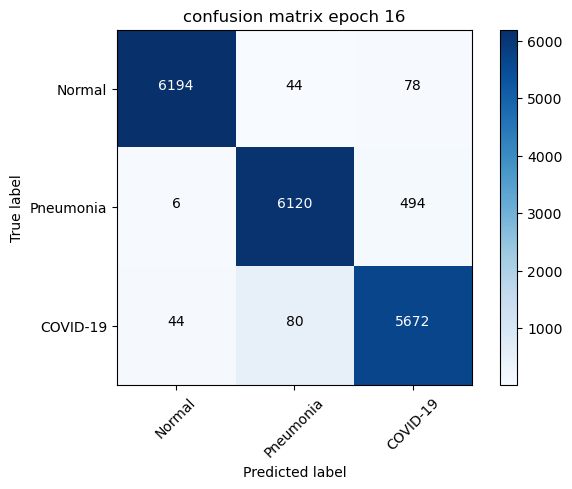

val_total Loss: 0.2074 Acc: 96.0175%
all_prediction:96.02
0 	 Normal 	 prediction= 98.07 %,	recall= 99.2 %,	f1= 98.63
1 	 Pneumonia 	 prediction= 92.45 %,	recall= 98.01 %,	f1= 95.15
2 	 COVID-19 	 prediction= 97.86 %,	recall= 90.84 %,	f1= 94.22
MACRO-averaged:
prediction= 96.13 %,recall= 96.02 %,f1= 96.07
----------------------------------------------------------------------------------------------------
Epoch 17/24
train iteration:99,loss:0.0013784405309706926,acc:100.0%
train iteration:199,loss:0.0033311699517071247,acc:100.0%
train iteration:299,loss:0.028319107368588448,acc:98.4375%
train iteration:399,loss:0.06831851601600647,acc:98.4375%
train iteration:499,loss:0.008712880313396454,acc:100.0%
train iteration:599,loss:0.006669140420854092,acc:100.0%
train iteration:699,loss:0.000848072930239141,acc:100.0%
train iteration:799,loss:0.002185480436310172,acc:100.0%
train iteration:899,loss:0.009287580847740173,acc:100.0%
train iteration:999,loss:0.0012615852756425738,acc:100.0%
train

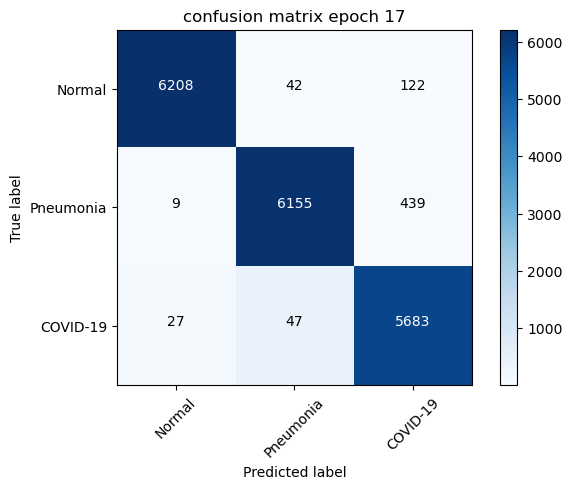

val_total Loss: 0.1557 Acc: 96.3378%
all_prediction:96.34
0 	 Normal 	 prediction= 97.43 %,	recall= 99.42 %,	f1= 98.41
1 	 Pneumonia 	 prediction= 93.22 %,	recall= 98.57 %,	f1= 95.82
2 	 COVID-19 	 prediction= 98.71 %,	recall= 91.02 %,	f1= 94.71
MACRO-averaged:
prediction= 96.45 %,recall= 96.34 %,f1= 96.39
----------------------------------------------------------------------------------------------------
Epoch 18/24
train iteration:99,loss:0.0035283949691802263,acc:100.0%
train iteration:199,loss:0.003273195354267955,acc:100.0%
train iteration:299,loss:0.002095039002597332,acc:100.0%
train iteration:399,loss:0.0024519485887140036,acc:100.0%
train iteration:499,loss:0.012783857993781567,acc:100.0%
train iteration:599,loss:0.0007630821201018989,acc:100.0%
train iteration:699,loss:0.002556697465479374,acc:100.0%
train iteration:799,loss:0.0003783905995078385,acc:100.0%
train iteration:899,loss:0.0003686595882754773,acc:100.0%
train iteration:999,loss:0.0006186991231516004,acc:100.0%
trai

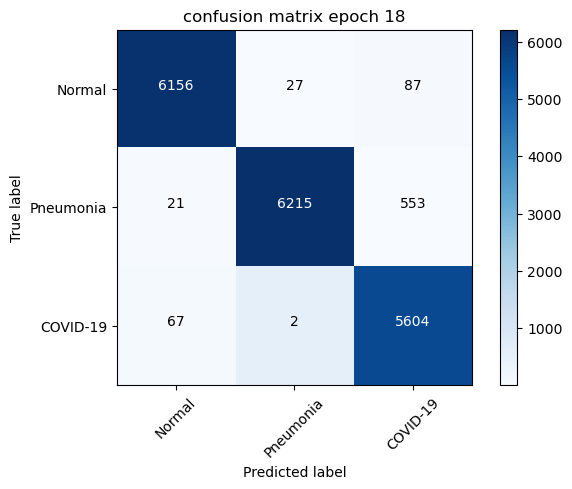

val_total Loss: 0.2561 Acc: 95.9588%
all_prediction:95.96
0 	 Normal 	 prediction= 98.18 %,	recall= 98.59 %,	f1= 98.38
1 	 Pneumonia 	 prediction= 91.55 %,	recall= 99.54 %,	f1= 95.38
2 	 COVID-19 	 prediction= 98.78 %,	recall= 89.75 %,	f1= 94.05
MACRO-averaged:
prediction= 96.17 %,recall= 95.96 %,f1= 96.06
----------------------------------------------------------------------------------------------------
Epoch 19/24
train iteration:99,loss:0.0033659571781754494,acc:100.0%
train iteration:199,loss:0.00012438950943760574,acc:100.0%
train iteration:299,loss:0.0008259844616986811,acc:100.0%
train iteration:399,loss:0.0035071149468421936,acc:100.0%
train iteration:499,loss:0.0013778966385871172,acc:100.0%
train iteration:599,loss:0.0060448725707829,acc:100.0%
train iteration:699,loss:0.006807133089751005,acc:100.0%
train iteration:799,loss:0.0010774893453344703,acc:100.0%
train iteration:899,loss:8.398073987336829e-05,acc:100.0%
train iteration:999,loss:0.0004929964779876173,acc:100.0%
tra

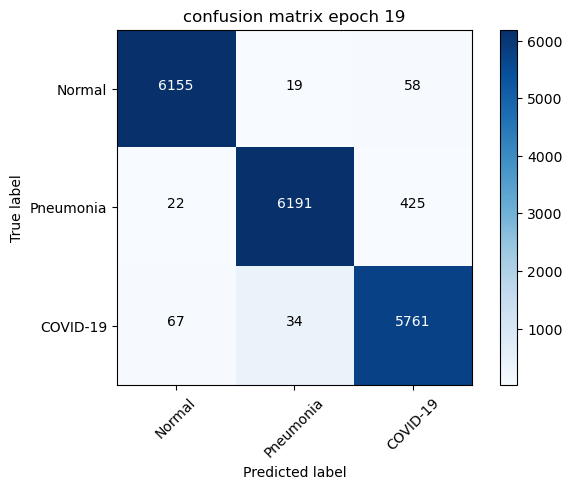

val_total Loss: 0.1536 Acc: 96.6635%
all_prediction:96.66
0 	 Normal 	 prediction= 98.76 %,	recall= 98.57 %,	f1= 98.66
1 	 Pneumonia 	 prediction= 93.27 %,	recall= 99.15 %,	f1= 96.12
2 	 COVID-19 	 prediction= 98.28 %,	recall= 92.26 %,	f1= 95.17
MACRO-averaged:
prediction= 96.77 %,recall= 96.66 %,f1= 96.71
----------------------------------------------------------------------------------------------------
Epoch 20/24
train iteration:99,loss:0.0005209497176110744,acc:100.0%
train iteration:199,loss:0.0009528942173346877,acc:100.0%
train iteration:299,loss:0.002718804171308875,acc:100.0%
train iteration:399,loss:8.631394302938133e-05,acc:100.0%
train iteration:499,loss:0.0001338476431556046,acc:100.0%
train iteration:599,loss:0.002003918867558241,acc:100.0%
train iteration:699,loss:0.0012260042130947113,acc:100.0%
train iteration:799,loss:0.07330980896949768,acc:98.4375%
train iteration:899,loss:0.00032783407368697226,acc:100.0%
train iteration:999,loss:2.8506176022347063e-05,acc:100.0%


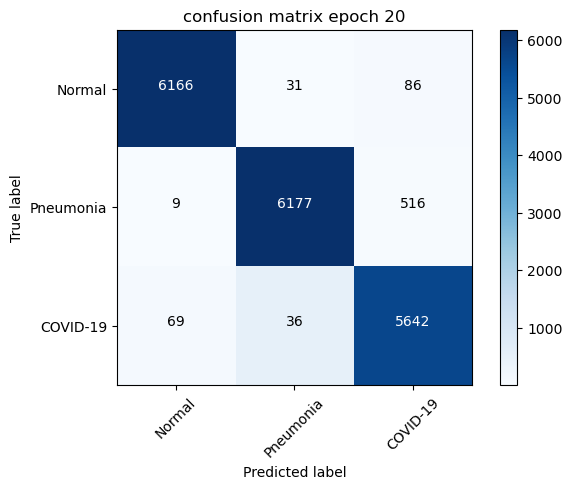

val_total Loss: 0.2588 Acc: 96.0122%
all_prediction:96.01
0 	 Normal 	 prediction= 98.14 %,	recall= 98.75 %,	f1= 98.44
1 	 Pneumonia 	 prediction= 92.17 %,	recall= 98.93 %,	f1= 95.43
2 	 COVID-19 	 prediction= 98.17 %,	recall= 90.36 %,	f1= 94.1
MACRO-averaged:
prediction= 96.16 %,recall= 96.01 %,f1= 96.08
----------------------------------------------------------------------------------------------------
Epoch 21/24
train iteration:99,loss:0.0019345784094184637,acc:100.0%
train iteration:199,loss:0.003166829003021121,acc:100.0%
train iteration:299,loss:0.011840274557471275,acc:100.0%
train iteration:399,loss:0.0003700322122313082,acc:100.0%
train iteration:499,loss:9.364914876641706e-05,acc:100.0%
train iteration:599,loss:0.00025152493617497385,acc:100.0%
train iteration:699,loss:0.0002735452144406736,acc:100.0%
train iteration:799,loss:0.00239585991948843,acc:100.0%
train iteration:899,loss:7.01071330695413e-05,acc:100.0%
train iteration:999,loss:0.006199507974088192,acc:100.0%
train 

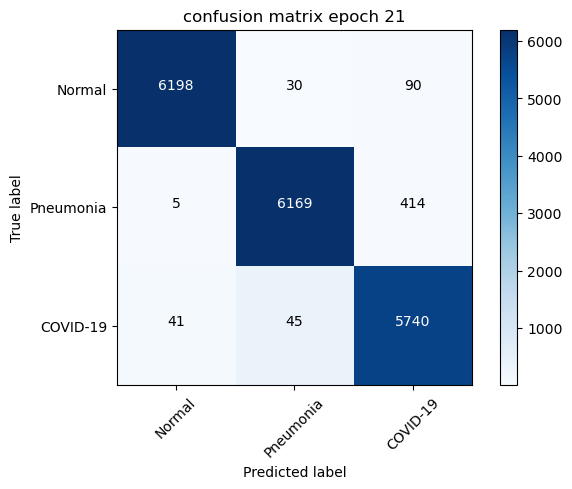

val_total Loss: 0.1568 Acc: 96.6635%
all_prediction:96.66
0 	 Normal 	 prediction= 98.1 %,	recall= 99.26 %,	f1= 98.68
1 	 Pneumonia 	 prediction= 93.64 %,	recall= 98.8 %,	f1= 96.15
2 	 COVID-19 	 prediction= 98.52 %,	recall= 91.93 %,	f1= 95.11
MACRO-averaged:
prediction= 96.75 %,recall= 96.66 %,f1= 96.7
----------------------------------------------------------------------------------------------------
Epoch 22/24
train iteration:99,loss:5.0584698328748345e-05,acc:100.0%
train iteration:199,loss:0.0005277522723190486,acc:100.0%
train iteration:299,loss:0.0014996709069237113,acc:100.0%
train iteration:399,loss:4.1006314859259874e-05,acc:100.0%
train iteration:499,loss:0.01645917259156704,acc:98.4375%
train iteration:599,loss:0.01627654768526554,acc:100.0%
train iteration:699,loss:0.0043389941565692425,acc:100.0%
train iteration:799,loss:0.0002453232591506094,acc:100.0%
train iteration:899,loss:0.00016633962513878942,acc:100.0%
train iteration:999,loss:0.0007030187989585102,acc:100.0%
tr

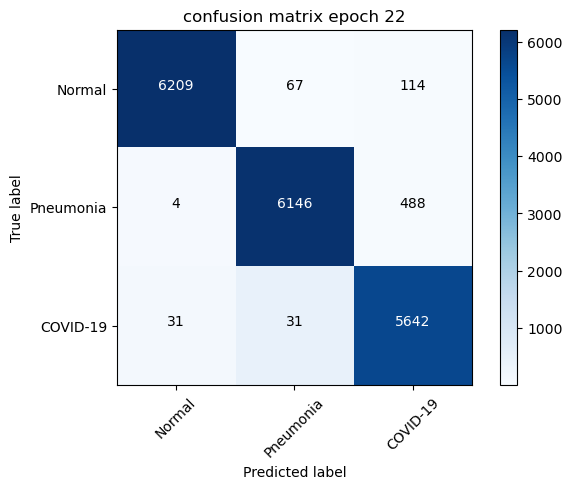

val_total Loss: 0.2079 Acc: 96.0762%
all_prediction:96.08
0 	 Normal 	 prediction= 97.17 %,	recall= 99.44 %,	f1= 98.29
1 	 Pneumonia 	 prediction= 92.59 %,	recall= 98.43 %,	f1= 95.42
2 	 COVID-19 	 prediction= 98.91 %,	recall= 90.36 %,	f1= 94.44
MACRO-averaged:
prediction= 96.22 %,recall= 96.08 %,f1= 96.15
----------------------------------------------------------------------------------------------------
Epoch 23/24
train iteration:99,loss:0.01217180211097002,acc:100.0%
train iteration:199,loss:0.0013658464886248112,acc:100.0%
train iteration:299,loss:0.002563740126788616,acc:100.0%
train iteration:399,loss:0.0011283212807029486,acc:100.0%
train iteration:499,loss:0.0002693800488486886,acc:100.0%
train iteration:599,loss:0.003110242774710059,acc:100.0%
train iteration:699,loss:0.004277016967535019,acc:100.0%
train iteration:799,loss:0.0001910678402055055,acc:100.0%
train iteration:899,loss:0.0002954850788228214,acc:100.0%
train iteration:999,loss:0.0006425982574000955,acc:100.0%
train

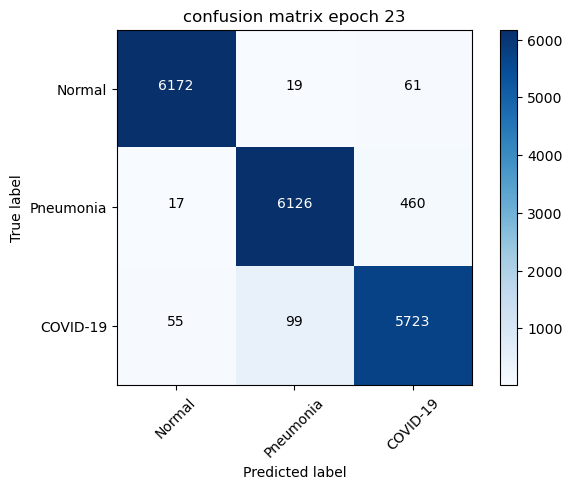

val_total Loss: 0.2097 Acc: 96.2044%
all_prediction:96.2
0 	 Normal 	 prediction= 98.72 %,	recall= 98.85 %,	f1= 98.78
1 	 Pneumonia 	 prediction= 92.78 %,	recall= 98.11 %,	f1= 95.37
2 	 COVID-19 	 prediction= 97.38 %,	recall= 91.66 %,	f1= 94.43
MACRO-averaged:
prediction= 96.29 %,recall= 96.21 %,f1= 96.25
----------------------------------------------------------------------------------------------------
Epoch 24/24
train iteration:99,loss:0.0002453843189869076,acc:100.0%
train iteration:199,loss:0.0032367859967052937,acc:100.0%
train iteration:299,loss:0.00045942136785015464,acc:100.0%
train iteration:399,loss:0.00032452246523462236,acc:100.0%
train iteration:499,loss:0.002238909248262644,acc:100.0%
train iteration:599,loss:0.0012530738022178411,acc:100.0%
train iteration:699,loss:0.001286070211790502,acc:100.0%
train iteration:799,loss:0.0064054992981255054,acc:100.0%
train iteration:899,loss:7.86099917604588e-05,acc:100.0%
train iteration:999,loss:0.000535548955667764,acc:100.0%
tra

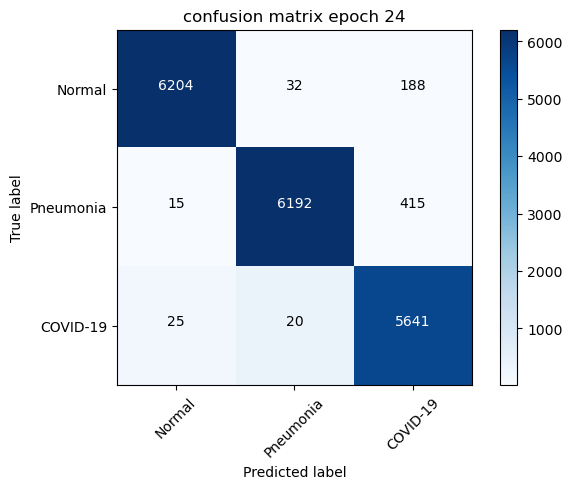

val_total Loss: 0.1543 Acc: 96.2898%
all_prediction:96.29
0 	 Normal 	 prediction= 96.58 %,	recall= 99.36 %,	f1= 97.95
1 	 Pneumonia 	 prediction= 93.51 %,	recall= 99.17 %,	f1= 96.26
2 	 COVID-19 	 prediction= 99.21 %,	recall= 90.34 %,	f1= 94.57
MACRO-averaged:
prediction= 96.43 %,recall= 96.29 %,f1= 96.36
****************************************************************************************************
best_acc:0.9714392483450779
****************************************************************************************************


In [62]:
if __name__ == '__main__':
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    acc=[]
    loss=[]
    for epoch in range(num_epochs):
        epoch_loss=train(model,epoch,num_epochs,criterion,optimizer)
        best_model_wts,best_acc,epoch_acc=test(model,epoch,num_epochs,criterion,optimizer,best_acc)
        acc.append(epoch_acc)
        loss.append(epoch_loss)
    print('*' * 100)
    print('best_acc:{}'.format(best_acc))
    print('*' * 100)
    torch.save(best_model_wts, 'densenet201_3_model_best_acc.pth')

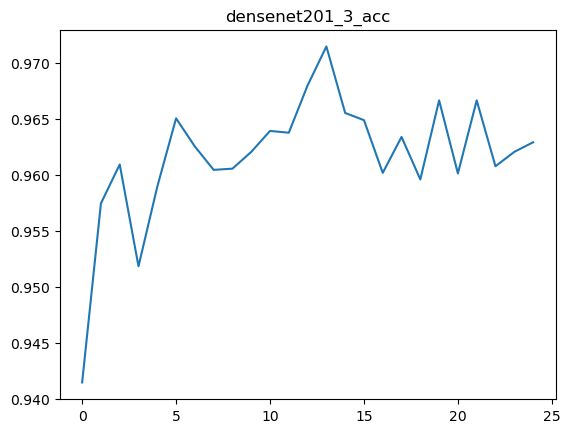

In [63]:
x=range(len(acc))
y=acc
plt.figure()
plt.title('densenet201_3_acc')
plt.plot(x,y)
plt.savefig('mini64_lr0.0001_e20_densenet201_3_acc.jpg')
plt.savefig('densenet201_3_acc.png')
plt.show()

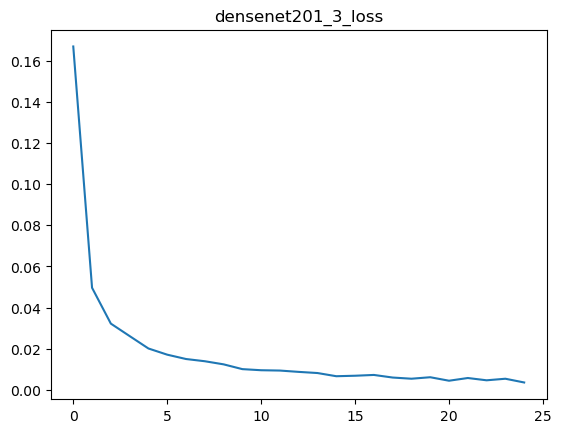

In [64]:
x=range(len(loss))
y=loss
plt.figure()
plt.title('densenet201_3_loss')
plt.plot(x,y)
plt.savefig('mini64_lr0.0001_e20_densenet201_3_loss.jpg')
plt.savefig('densenet201_3_loss.png')
plt.show()